# Universidad de Buenos Aires - FIUBA - LSE

# Aprendizaje Profundo - TP1

# Cohorte 24 - 2do bimestre 2026


Este primer TP comienza la semana de la clase 2 y la ventana de entrega estará abierta hasta las **23:59 hs del jueves 21 de mayo (hora de Argentina)**. La resolución del TP es **individual**. Pueden utilizar tanto los contenidos vistos en clase, como otra bibliografía externa. Si se toman ideas de fuentes externas deben ser correctamente citadas incluyendo el correspondiente link o página de libro.

ESTE TP1 EQUIVALE A UN TERCIO DE SU NOTA FINAL.

El formato de entrega debe ser un link a un notebook de google colab. Importante permitir acceso a gvilcamiza.ext@fi.uba.ar y **habilitar los comentarios, para poder darles el feedback**. Si no lo hacen así no se podrá dar el feedback respectivo por cada pregunta.

**El desarrollo del TP se debe hacer obligatoriamente en un notebook**, ya sea en un Google Colab o en un Jupyter Notebook para quienes quieran desarrollarlo en su propia PC local. Pero no se aceptarán archivos `.py` o links a repos de github con múltiples archivos. El entregable debe ser un link a un único archivo `.ipynb`.

El envío **se realizará en el siguiente link de google forms: [link](https://forms.gle/dMmn8VEJmvRmYgvi6)**. Tanto los resultados, tablas, gráficas, como el código y las explicaciones deben quedar guardados y visualizables en el mismo notebook.

**NO SE VALIDARÁN ENVÍOS POR CORREO, EL ÚNICO MÉTODO DE ENTREGA ES SOLO POR EL FORMS.**

**Consideraciones a tener en cuenta:**

- Se entregará 1 solo colab para este TP1.
- Renombrar el archivo de la siguiente manera: **APELLIDO-NOMBRE-DL-TP1-Co24.ipynb**
- Los códigos deben poder ejecutarse.
- **IMPORTANTE:** Los resultados, cómo el código, los gráficos, los prints y las explicaciones deben quedar guardados y visualizables en el mismo notebook.
- **Prestar mucha atención a cada consigna, responder las preguntas justo debajo del enunciado que corresponda.**
- Solo se revisarán los trabajos que hayan sido enviados por el forms.


# **PREGUNTA 1** (Temas de la clase 1 y 2)


## **Comparación de Gradiente Descendente y Adam en una Función de Costo No Convexa**

En este ejercicio se compararán los optimizadores Gradiente Descendente (GD) y Adam en la minimización de una función de costo basada en una red neuronal de una sola conexión sináptica:

$$
z = w x + b
$$

Con función de activación tangente hiperbólica:

$$
\hat{y} = a(z) = \tanh(z) = \tanh(w x + b)
$$

<br>

Se analizará la trayectoria de aprendizaje de ambos algoritmos y se evaluará su eficiencia con diferentes tasas de aprendizaje (learning rate).

<br>

La función de costo utilizada es el Error Cuadrático Medio (MSE):

$$
J(w, b) = \frac{1}{m} \sum_{i=1}^{m} (\hat{y}_i - y_i)^2
$$

$$
J(w, b) = \frac{1}{m} \sum_{i=1}^{m} ( \tanh(w x_i + b) - y_i )^2
$$

donde \\( w \\) y \\( b \\) son los parámetros a optimizar.

<br>

Si bien es cierto, en estos experimentos buscamos tan solo comparar optimizadores (GD vs Adam), de igual forma se necesitará una especie de dataset. Este será sintético y solo de prueba, por ende tendrán cierta libertad para elegir sus valores. Sin embargo deberán tomar en cuenta que cumpla la siguiente estructura:

`x = np.linspace(ini, fin, n)`

donde `x` es un array de una sola dimensión y con `n` cantidad de valores ($n>=200$). Y tiene un rango de valores desde `ini` hasta `fin`. Recomiendo que sea simétrico, es decir, los mismos valores solo que con el signo cambiado, por ejemplo `ini=-3, fin=3`, `ini=-5, fin=5`, `ini=-10, fin=10`, etc. Queda a elección de ustedes.

<br>

Y con un target `y`:

`y = funcion_no_lineal(x) + ruido`

donde `y` es también un vector de una sola dimensión de tamaño `n` que sigue un patrón no lineal (elegido por ustedes) con respecto a `x` adicionando un ruido que puede ser creado con algunas de las funciones del paquete `np.random`.

El patrón no lineal puede ser una función trigonométrica, exponencial, logarítmica, sigmoidal, polinómica de grado mayor o igual a 3, o la combinación de varias de estas (recomendado). Pero sean prudentes en la elección de la función no lineal, ya que recuerden que es una red de una sola conexión, por ende tampoco elijan algo tan complejo que al final provoque que el modelo no pueda converger.


### 1a) Implementación del Gradiente Descendente (1 punto)

- Implementar el algoritmo del Gradiente Descendente (GD) para minimizar \\( J(w, b) \\).
- Utilizar 100 épocas y 3 diferentes learning rates `(0.1, 0.01, 0.001)`.
- Inicializar valores de \\( w \\) y \\( b \\) de manera aleatoria con `np.random.randn()`.
- Graficar la función de Costo \\( J(w, b) \\) VS número de época para comparar cómo converge la función para los 3 learning rates. Las 3 gráficas deben estar en el mismo plot para que la comparación visual sea más fácil.

<br>

El optimizador del Gradiente Descendente se debe implementar haciendo el código desde cero y paso a paso. Se pueden usar librerías como `numpy`, `scipy`, `matplotlib` o similares. Pero no está permitido usar PyTorch ni TensorFlow o frameworks que ya contengan el optimizador desarrollado.


### Backprop hecho a mano para poder visualizar mejor el codigo a realizar


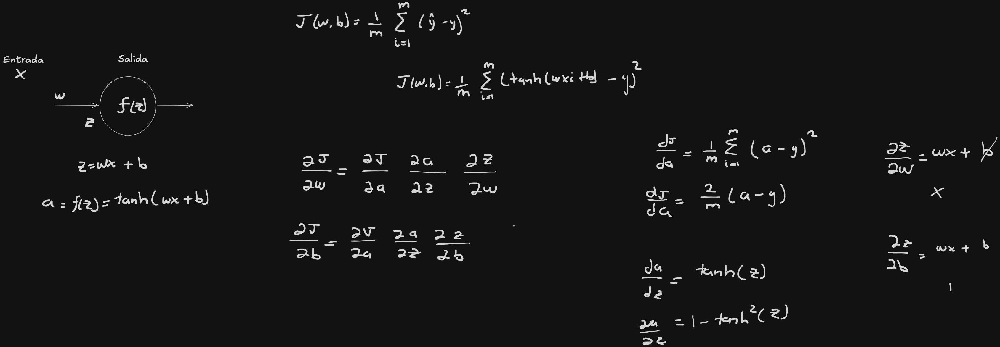


## Setup inicial


In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Dataset sintetico
np.random.seed(42)
rng = np.random.default_rng(7)
n = 200
X = np.linspace(-3, 3, n)
noise = rng.normal(0, 0.1, size=n)
Y = np.sin(X) + noise


# Setup
epochs = 100
learning_rates = [0.1, 0.01, 0.001]


def init_params():
    w = np.random.randn()
    b = np.random.randn()

    return w, b


w_init, b_init = init_params()

## Gradient Descent


In [38]:
def tanh(x):
    return np.tanh(x)


def feed_forward(X, w, b):
    z = w * X + b
    a = tanh(z)

    return z, a


def loss_mse(a, Y):
    return np.mean((a - Y) ** 2)


def backprop(X, Y, a):
    dj_da = 2 * (a - Y)
    da_dz = 1 - a**2
    dj_dz = dj_da * da_dz
    dj_dw = np.mean(dj_dz * X)
    dj_db = np.mean(dj_dz)

    return dj_dw, dj_db


def update_params(w, b, dj_dw, dj_db, lr):
    w = w - lr * dj_dw
    b = b - lr * dj_db

    return w, b


def gradient_descent(X, Y, w, b, epochs, lr):
    history = []

    # loss inicial
    _, a = feed_forward(X, w, b)
    history.append(loss_mse(a, Y))

    for i in range(epochs):
        _, a = feed_forward(X, w, b)
        dj_dw, dj_db = backprop(X, Y, a)
        w, b = update_params(w, b, dj_dw, dj_db, lr)

        # loss despues del update
        _, a = feed_forward(X, w, b)
        history.append(loss_mse(a, Y))

    return w, b, history


results_gd = {}

for lr in learning_rates:
    w, b, history = gradient_descent(X, Y, w_init, b_init, epochs, lr)
    results_gd[lr] = {"w": w, "b": b, "history": history}

print(results_gd)

{0.1: {'w': np.float64(0.9152710248788426), 'b': np.float64(-0.016329301835571908), 'history': [np.float64(0.11505820324272534), np.float64(0.11044371089570833), np.float64(0.10681321573566), np.float64(0.10388814547547913), np.float64(0.10148465847882605), np.float64(0.09947670942218245), np.float64(0.0977751548419846), np.float64(0.09631530155260283), np.float64(0.09504916258190599), np.float64(0.09394046611133387), np.float64(0.09296134023259695), np.float64(0.09209005319543156), np.float64(0.09130943822984988), np.float64(0.0906057738293244), np.float64(0.08996797390195209), np.float64(0.0893869929353256), np.float64(0.08885538299795513), np.float64(0.08836695966244623), np.float64(0.08791654718065295), np.float64(0.08749978206933283), np.float64(0.08711296025369815), np.float64(0.08675291704431394), np.float64(0.0864169321099153), np.float64(0.0861026536549983), np.float64(0.08580803747921467), np.float64(0.08553129766093377), np.float64(0.08527086638847106), np.float64(0.08502536

In [39]:
def plot_cost_history(results, title, learning_rates=learning_rates):
    for lr in learning_rates:
        history = results[lr]["history"]
        epochs_axis = np.arange(len(history))
        plt.plot(epochs_axis, history, label=f"lr={lr}")

    plt.xlabel("Epoca")
    plt.ylabel("J (MSE)")
    plt.legend()
    plt.title(title)
    plt.show()

In [40]:
# helper function para graficar prediciones


def plot_predictions(title, results, learning_rates=learning_rates):
    fig, axes = plt.subplots(
        1, len(learning_rates), figsize=(5 * len(learning_rates), 4)
    )
    if len(learning_rates) == 1:
        axes = [axes]

    for ax, lr in zip(axes, learning_rates):
        w = results[lr]["w"]
        b = results[lr]["b"]
        _, y_pred = feed_forward(X, w, b)

        ax.plot(X, Y, label="Target real")
        ax.plot(X, y_pred, label=f"Prediccion lr={lr}")
        ax.legend()
        ax.set_title(f"{title} lr={lr}")

    plt.tight_layout()
    plt.show()

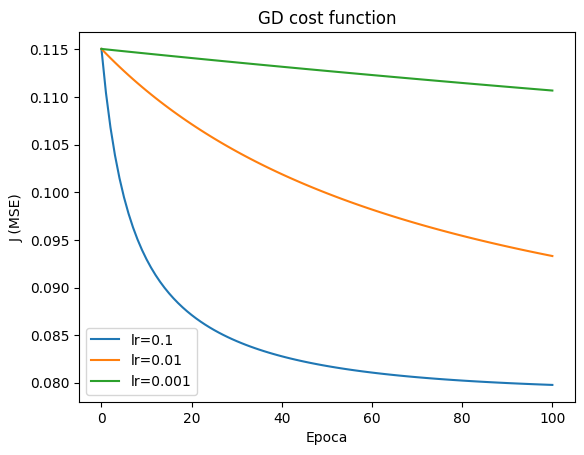

In [41]:
plot_cost_history(results_gd, "GD cost function")

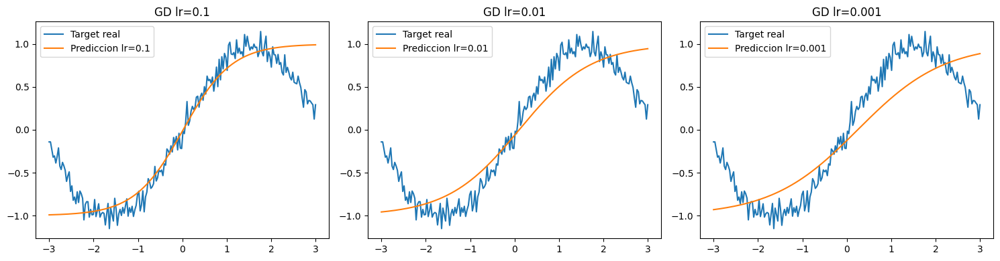

In [42]:
plot_predictions("GD", results_gd)

### 1b) Implementación de Adam (2 punto)

- Implementar el algoritmo de Adam para minimizar \\( J(w, b) \\).
- Utilizar 100 épocas y 3 diferentes learning rates `(0.1, 0.01, 0.001)`.
- Utilizar los mismos valores de \\( w \\) y \\( b \\) que se usaron para GD **(IMPORTANTE)**.
- Hacer 2 modelos, uno sin mini-batch (full-batch) y otro con mini-batch.
- El batch size es a elección de ustedes, pero debe ser mayor o igual a 16.
- Graficar la función de Costo \\( J(w, b) \\) VS número de época para comparar cómo converge la función para ambos modelos y para los 3 learning rates. Deben haber 2 plots separados o 2 subplots, uno para las 3 gráficas de Adam full-batch y otro para las 3 gráficas de Adam mini-batch.

<br>

Al igual que para GD, ambas versiones del optimizador Adam también se deben implementar desde cero y paso a paso. Se pueden usar librerías como `numpy`, `scipy`, `matplotlib` o similares. Pero no está permitido usar PyTorch ni TensorFlow o frameworks que ya contengan el optimizador desarrollado.


## Adam (full-batch)

Me apoyé en recursos de Youtube de Andrew Ng del canal deeplearningAI. No entendia completamente Adam ya que verlo por si solo cuesta un poco entenderlo sin saber que une los algoritmos "Gradient Descent with momentum" y "RMSprop".

Playlist: `https://www.youtube.com/playlist?list=PLkDaE6sCZn6Hn0vK8co82zjQtt3T2Nkqc`


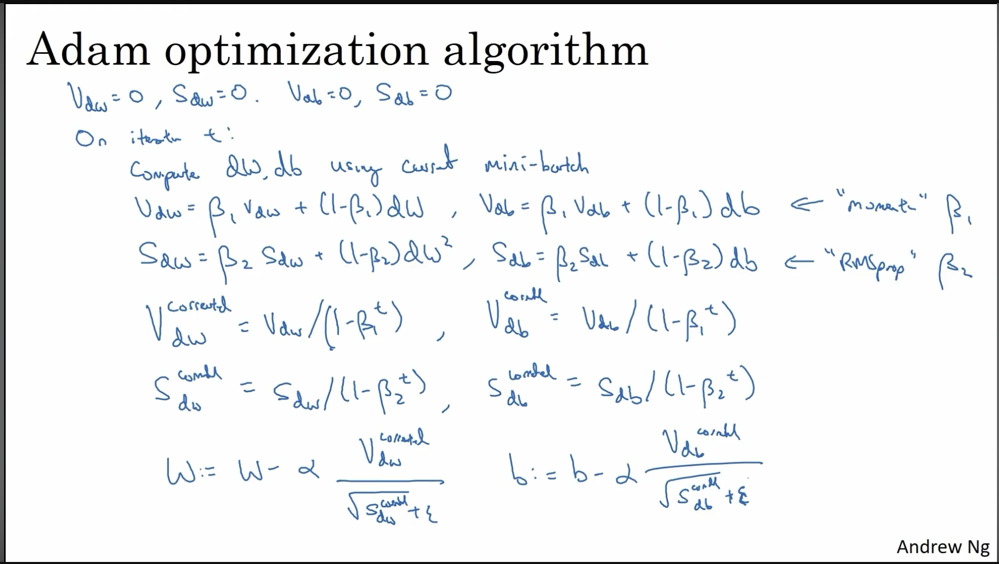


In [43]:
beta1, beta2 = (0.9, 0.999)
epsilon = 1e-8


def update_params_adam(w, b, vdw_corr, sdw_corr, vdb_corr, sdb_corr, lr):
    w = w - lr * vdw_corr / (np.sqrt(sdw_corr) + epsilon)
    b = b - lr * vdb_corr / (np.sqrt(sdb_corr) + epsilon)

    return w, b


def adam(X, Y, epochs, lr, w_init, b_init, beta1, beta2):
    history = []
    w, b = w_init, b_init

    # momentos gd y rmsprop
    vdw, sdw = 0, 0
    vdb, sdb = 0, 0

    # loss inicial
    _, a = feed_forward(X, w, b)
    history.append(loss_mse(a, Y))

    for t in range(1, epochs + 1):
        _, a = feed_forward(X, w, b)
        dj_dw, dj_db = backprop(X, Y, a)

        vdw = beta1 * vdw + (1 - beta1) * dj_dw
        sdw = beta2 * sdw + (1 - beta2) * dj_dw**2
        vdb = beta1 * vdb + (1 - beta1) * dj_db
        sdb = beta2 * sdb + (1 - beta2) * dj_db**2

        vdw_corr = vdw / (1 - beta1**t)
        sdw_corr = sdw / (1 - beta2**t)
        vdb_corr = vdb / (1 - beta1**t)
        sdb_corr = sdb / (1 - beta2**t)

        w, b = update_params_adam(w, b, vdw_corr, sdw_corr, vdb_corr, sdb_corr, lr)

        # loss despues del update
        _, a = feed_forward(X, w, b)
        history.append(loss_mse(a, Y))

    return w, b, history

In [44]:
results_adam = {}

for lr in learning_rates:
    w, b, history_adam = adam(X, Y, epochs, lr, w_init, b_init, beta1, beta2)
    results_adam[lr] = {"w": w, "b": b, "history": history_adam}

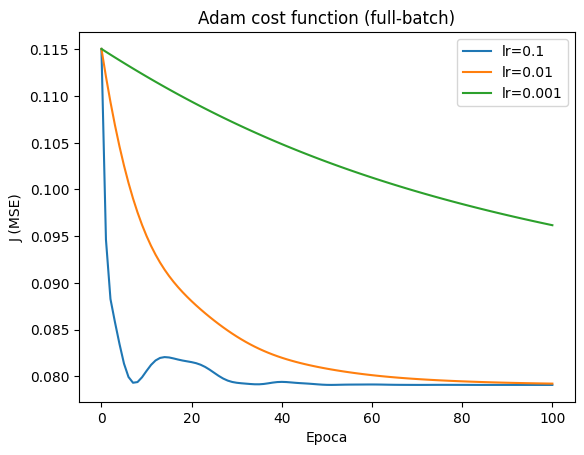

In [45]:
plot_cost_history(results_adam, "Adam cost function (full-batch)")

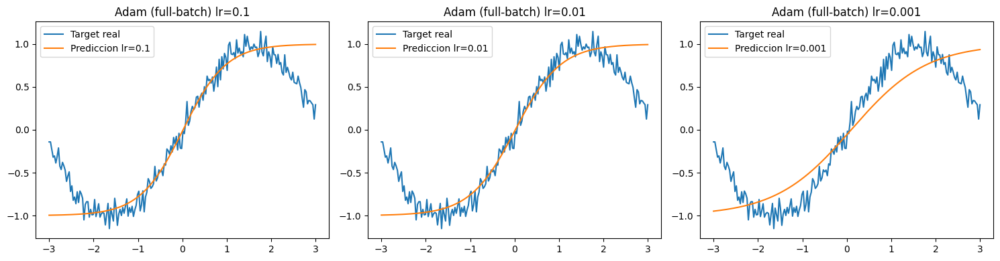

In [46]:
plot_predictions("Adam (full-batch)", results_adam)

## Adam (mini-batch)


In [47]:
def adam_minibatch(X, Y, epochs, lr, w_init, b_init, beta1, beta2, batch_size):
    history = []
    w, b = w_init, b_init
    vdw, sdw = 0, 0
    vdb, sdb = 0, 0
    t = 0

    m = len(X)

    # loss inicial
    _, a = feed_forward(X, w, b)
    history.append(loss_mse(a, Y))

    for epoch in range(epochs):
        # permutacion para variar los batchs
        idx = np.random.permutation(m)
        X_shuffled = X[idx]
        Y_shuffled = Y[idx]

        for start in range(0, m, batch_size):
            X_batch = X_shuffled[start : start + batch_size]
            Y_batch = Y_shuffled[start : start + batch_size]
            t += 1

            _, a = feed_forward(X_batch, w, b)
            dj_dw, dj_db = backprop(X_batch, Y_batch, a)

            vdw = beta1 * vdw + (1 - beta1) * dj_dw
            sdw = beta2 * sdw + (1 - beta2) * dj_dw**2
            vdb = beta1 * vdb + (1 - beta1) * dj_db
            sdb = beta2 * sdb + (1 - beta2) * dj_db**2

            vdw_corr = vdw / (1 - beta1**t)
            sdw_corr = sdw / (1 - beta2**t)
            vdb_corr = vdb / (1 - beta1**t)
            sdb_corr = sdb / (1 - beta2**t)

            w, b = update_params_adam(w, b, vdw_corr, sdw_corr, vdb_corr, sdb_corr, lr)

        # loss al final de cada época sobre todo el dataset
        _, a_full = feed_forward(X, w, b)
        history.append(loss_mse(a_full, Y))

    return w, b, history

In [48]:
results_adam_mb = {}

for lr in learning_rates:
    w, b, history = adam_minibatch(
        X, Y, epochs, lr, w_init, b_init, beta1, beta2, batch_size=32
    )
    results_adam_mb[lr] = {"w": w, "b": b, "history": history}

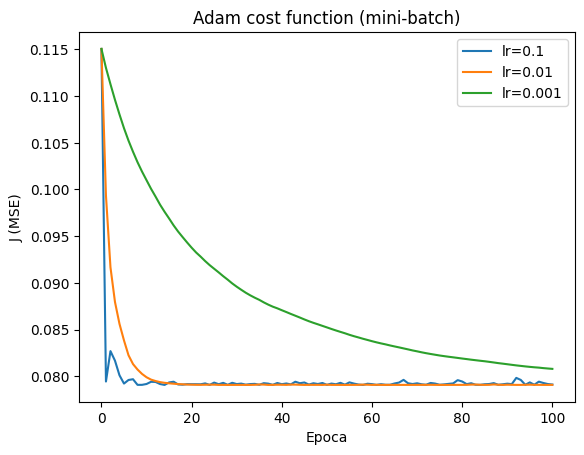

In [49]:
plot_cost_history(results_adam_mb, "Adam cost function (mini-batch)")

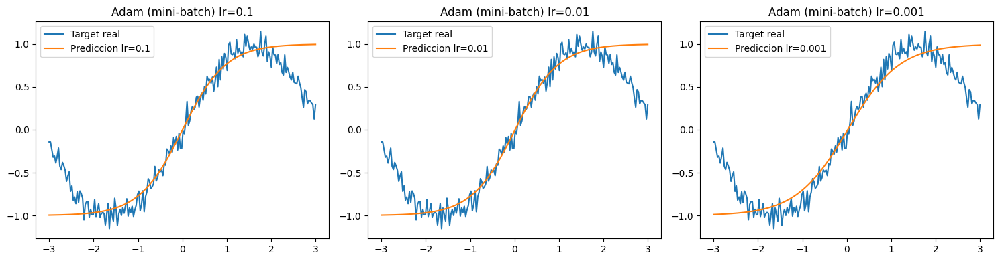

In [50]:
plot_predictions("Adam (mini-batch)", results_adam_mb)

### 1c) Comparativa de optimizadores (0.5 puntos)

- Comparar el resultado y rendimiento de GD VS Adam (full-batch) VS Adam (mini-batch) para cada uno de los learning rates por separado. Hacerlo con gráficas y tablas. Deben haber 3 plots o 3 subplots, uno para cada learning rate.
- Graficar el dataset original sintético (y(x)) y compararlo con la función hallada por el modelo, para ver si efectivamente el modelo logró deducir un patrón no lineal parecido al patrón no lineal escogido para el dataset. Hacerlo para cada optimizador y cada learning rate en un plot grande de 9 subplots.
- Redactar conclusiones analíticas que resalten las diferencias entre cada optimizador. No solo deben comparar el resultado final del costo, sino también la velocidad de convergencia y otros aspectos que consideren relevantes.


## Comparacion de resultados y rendimiento


### Analisis de función de costo vs epochs


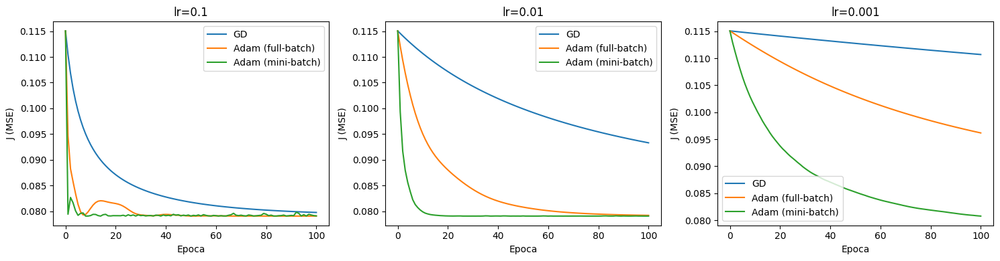

In [51]:
def plot_cost_comparison(results_dict, learning_rates=learning_rates):
    fig, axes = plt.subplots(
        1, len(learning_rates), figsize=(5 * len(learning_rates), 4)
    )

    for ax, lr in zip(axes, learning_rates):
        for name, results in results_dict.items():
            history = results[lr]["history"]
            epochs_axis = np.arange(len(history))
            ax.plot(epochs_axis, history, label=name)
        ax.set_xlabel("Epoca")
        ax.set_ylabel("J (MSE)")
        ax.set_title(f"lr={lr}")
        ax.legend()

    plt.tight_layout()
    plt.show()


results_dict = {
    "GD": results_gd,
    "Adam (full-batch)": results_adam,
    "Adam (mini-batch)": results_adam_mb,
}

plot_cost_comparison(results_dict)

En primer lugar, el error minimo alcanzable esta limitado por la capacidad del modelo. Una sola neurona (tanh) no puede aproximar bien a una funcion oscilante como sin(x). De igual manera, solo se pretende ver el performance de los optimizadores.

Para Gradient Descent tenemos los siguientes resultados:

- lr = 0.1: Converge a 0.08 en pocas epochs, siendo el mejor de los 3 learning rates.

- lr = 0.01: Sigue bajando en la ultima epoch, pero no logra converger en el limite de 100 epochs

- lr = 0.001: Casi plano, tiene sentido considerando que es un learning rate muy pequeño.
  - Se ven resultados esperados, es un "viaje" suave del error. No es un algoritmo adaptativo ya que no acumula información histórica del gradiente (momentum) ni ajusta el learning rate individualmente por parametro. Este modelo solamente tiene dos parametros (w y b), por lo tanto usa el mismo learning rate para ambos sin considerar que el gradiente para uno puede ser pequeño y/o grande para otro. Esto se visualiza mejor en redes con mas parametros, GD no "adapta el learning rate" para los parametros. El learning rate no es adaptable (hiperparametro), sino que la "fuerza" con la que se ajustan los parametros si se puede adaptar como en Adam o en otros algoritmos como GD momentum, RMSprop, etc.

Para Adam (full-batch) tenemos los siguientes resultados:

- lr = 0.1: Converge rápidamente al mínimo error, se eleva brevemente y luego se estabiliza. Adam usa EWA (exponentially weighted averages), por lo que esta oscilacion del error es un fenomeno esperado. Al inicio ambos momentos son 0 y la corrección de bias hace que que el `paso efectivo` sea aproximadamente 0.1 ya que iguala los momentos con el gradiente real, como si ya estuvieran calibrados. Este paso efectivo de 0.1 es lo que provoca que el modelo converga rapidamente y overshootee el óptimo. A medida que el algoritmo avanza, los gradientes reales van bajando y el momento "crudo" va creciendo desde un valor muy pequeño (aún no es un promedio confiable del gradiente). La corrección del bias corrige ese subestimado desde la primera iteración. Esta corrección de bias eventualmente se vuelve despreciable a medida que `t` crece y el momento crudo ya es un buen estimador por si solo. Cuando los gradientes son 0 o cambian de signo, el momento aún no sabe esta información ya que es un promedio de los gradientes provocando que el modelo oscile brevement (aumento del error) antes de estabilizarse.
- lr = 0.01: Aqui el algoritimo logra converger en pocas epocas, sin el problema de oscilación fuerte en las primeras epocas debido a que el `paso efectivo` es mucho más pequeño que con `lr=0.1` y el modelo nunca se pasa del óptimo por lo que los momentos acumulan poca inercia en la dirección incorrecta y el modelo es capaz de corregirse suavemente.

- lr = 0.001: Aqui el algoritmo no logra converger dentro de las 100 epocas pero muestra un mejor rendimiento que GD con el mismo lr debido a que Adam adapta los pasos usando los valores históricos del gradiente, por lo que es más rápido.

Para Adam (mini-batch) tenemos los siguientes resultados:

- lr = 0.1: Aqui podemos ver un comportamiento similar a Adam (full-batch) en el sentido que el modelo oscila alrededor del valor óptimo con la diferencia que mini-batch lo hace de forma persistente sin estabilizarse. Esto tiene sentido debido a que Adam mini-batch no ve todos los datos en cada update, cada batch da una estimación distinta del gradiente verdadero y con un learning rate alto, el modelo no logra suavizar. Adam (full-batch) si calcula el gradiente exacto sobre todos los datos por lo que en iteraciones avanzadas este gradiente es consistente y pequeño y se estabiliza.

- lr = 0.01: Converge rápidamente y de forma suave. Al ser un lr más pequeño genera un overshoot mínimo y hay poca inercia acumulada de los momentos en direcciones incorrectas. Debido a la naturaleza estocástica de mini-batch el ruido (oscilaciones) siguen existiendo pero con un lr más pequeño estas oscilaciones son imperceptibles. Además, mini-batch hace más actualizaciones de parámetros por epoch que full-batch, por lo que converge mucho más rápido. Por todo esto, Adam (mini-batch) con `lr=0.01` es el mejor optimizador observado para este problema.

- lr = 0.001: Aqui el algoritmo logra converger en el límite de epochs, converge suavemente y superando claramente a GD y Adam (full-batch) con el mismo lr. Mini-batch hace más actualizaciones por epoch, lo que le permite alcanzar el óptimo donde los otros dos no logran llegar.


### Analisis de capacidad de ajuste de los modelos


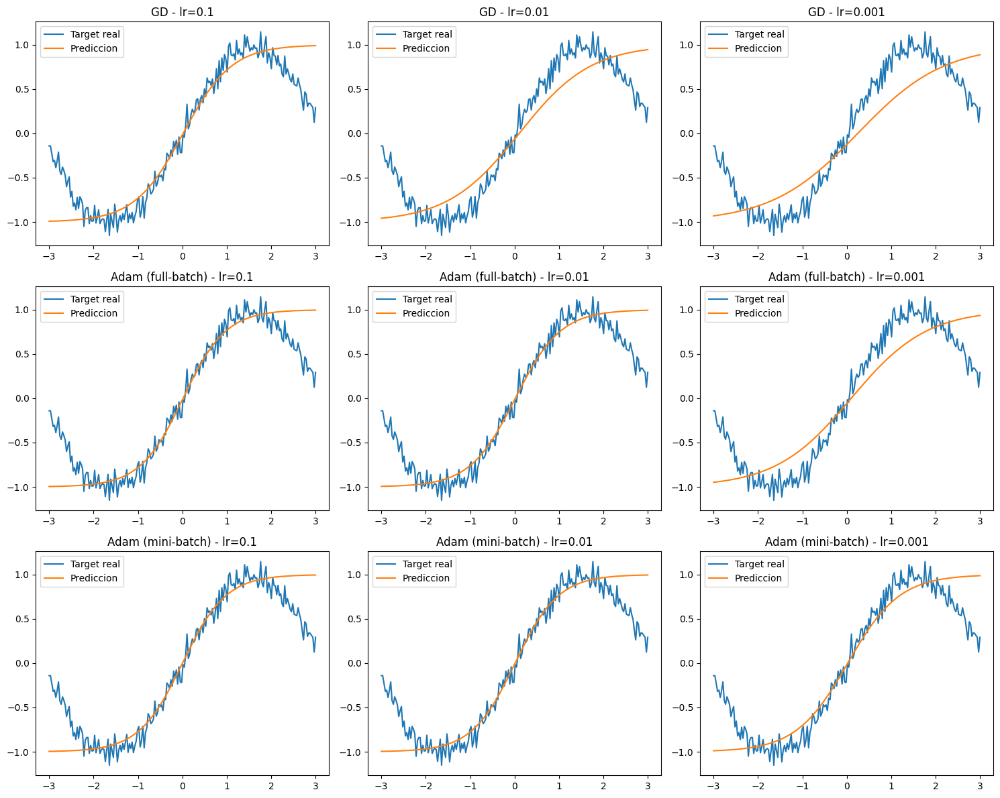

In [52]:
# helper para graficar tods los plots


def plot_predictions_grid(results_dict, learning_rates=learning_rates):
    n_rows = len(results_dict)
    n_cols = len(learning_rates)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))

    for row, (name, results) in enumerate(results_dict.items()):
        for col, lr in enumerate(learning_rates):
            ax = axes[row, col]
            w = results[lr]["w"]
            b = results[lr]["b"]
            _, y_pred = feed_forward(X, w, b)

            ax.plot(X, Y, label="Target real")
            ax.plot(X, y_pred, label="Prediccion")
            ax.set_title(f"{name} - lr={lr}")
            ax.legend()

    plt.tight_layout()
    plt.show()


plot_predictions_grid(results_dict)

Como se mencionó anteriormente, con una sola neurona con función de activación tanh es imposible que se aproxime a una función oscilante como sin(x). El modelo actual busca la mejor curva que minimice el MSE ignorando que los extremos de la funcion sin(x) bajen o suban. El comportamiento descrito anteriormente podria aproximarse muy bien a sin(x) pero con muchas mas neuronas que solamente 1, además sin(x) es una funcion oscilante y el modelo seria entrenado en un rango especifico, fuera de ese rango el modelo no generalizaría.

Si bien es cierto los modelos logran converger a un error mínimo para este caso especifico no significa que son capaces de aproximar correctamente a sin(x). El modelo simplemente aprendió la mejor curva que minimice MSE, pero que no captura perfectamente la forma real del target. Este es un problema de la capacidad inherente del modelo y no del optimizador, no tiene las suficientes capas y/o neuronas para lograr aproximar la función.

Teniendo en cuenta lo anterior, los optimizadores que lograron converger al minimo de la funcion de costo alcanzaron la mejor aproximacion posible del target dada la arquitectura de la red (una sola neurona).

Considero que el optimizador no es el problema debido a que incluso GD logra acercarse al mínimo en `lr=0.1` (casi al limite) en comparación con las dos versiones de Adam.

Finalizando: Debido a la velocidad de convergencia y estabilidad al momento de converger se concluye que el mejor optimizador para este problema es Adam (mini-batch) con un learning rate de 0.01.


### 1d) Visualización en 3D de la trayectoria de aprendizaje (0.5 puntos)

- Graficar en 3D la trayectoria del aprendizaje de los 3 optimizadores sobre la superficie de la función de costo \\( J(w, b) \\). Se debe elegir un solo learning rate, el que consideres que se nota mejor la diferencia.
- Las 3 trayectorias deben estar en la misma superficie 3D y empezar en el mismo punto.
- Recomiendo utilizar `mpl_toolkits.mplot3d` y `np.meshgrid`, pero queda a su criterio la elección de funciones a usar para lograr el gráfico. También si desean pueden hacer que el gráfico sea animado usando `matplotlib.animation` y `IPython.display`.
- Comparar y redactar cómo se mueven en el espacio de parámetros y qué diferencias existen en la convergencia.


In [53]:
def gd_trajectory(X, Y, w, b, epochs, lr):
    w_hist, b_hist, J_hist = [w], [b], []
    _, a = feed_forward(X, w, b)
    J_hist.append(loss_mse(a, Y))
    for _ in range(epochs):
        _, a = feed_forward(X, w, b)
        dw, db = backprop(X, Y, a)
        w, b = update_params(w, b, dw, db, lr)
        _, a = feed_forward(X, w, b)
        w_hist.append(w)
        b_hist.append(b)
        J_hist.append(loss_mse(a, Y))
    return np.array(w_hist), np.array(b_hist), np.array(J_hist)


def adam_trajectory(X, Y, w, b, epochs, lr, beta1, beta2):
    w_hist, b_hist, J_hist = [w], [b], []
    vdw, sdw, vdb, sdb = 0, 0, 0, 0
    _, a = feed_forward(X, w, b)
    J_hist.append(loss_mse(a, Y))
    for t in range(1, epochs + 1):
        _, a = feed_forward(X, w, b)
        dw, db = backprop(X, Y, a)
        vdw = beta1 * vdw + (1 - beta1) * dw
        sdw = beta2 * sdw + (1 - beta2) * dw**2
        vdb = beta1 * vdb + (1 - beta1) * db
        sdb = beta2 * sdb + (1 - beta2) * db**2
        vdw_c = vdw / (1 - beta1**t)
        sdw_c = sdw / (1 - beta2**t)
        vdb_c = vdb / (1 - beta1**t)
        sdb_c = sdb / (1 - beta2**t)
        w, b = update_params_adam(w, b, vdw_c, sdw_c, vdb_c, sdb_c, lr)
        _, a = feed_forward(X, w, b)
        w_hist.append(w)
        b_hist.append(b)
        J_hist.append(loss_mse(a, Y))
    return np.array(w_hist), np.array(b_hist), np.array(J_hist)


def adam_minibatch_trajectory(X, Y, w, b, epochs, lr, beta1, beta2, batch_size):
    w_hist, b_hist, J_hist = [w], [b], []
    vdw, sdw, vdb, sdb = 0, 0, 0, 0
    t = 0
    m = len(X)
    _, a = feed_forward(X, w, b)
    J_hist.append(loss_mse(a, Y))
    for epoch in range(epochs):
        idx = np.random.permutation(m)
        X_s, Y_s = X[idx], Y[idx]
        for start in range(0, m, batch_size):
            Xb, Yb = X_s[start : start + batch_size], Y_s[start : start + batch_size]
            t += 1
            _, a = feed_forward(Xb, w, b)
            dw, db = backprop(Xb, Yb, a)
            vdw = beta1 * vdw + (1 - beta1) * dw
            sdw = beta2 * sdw + (1 - beta2) * dw**2
            vdb = beta1 * vdb + (1 - beta1) * db
            sdb = beta2 * sdb + (1 - beta2) * db**2
            vdw_c = vdw / (1 - beta1**t)
            sdw_c = sdw / (1 - beta2**t)
            vdb_c = vdb / (1 - beta1**t)
            sdb_c = sdb / (1 - beta2**t)
            w, b = update_params_adam(w, b, vdw_c, sdw_c, vdb_c, sdb_c, lr)
        _, a_full = feed_forward(X, w, b)
        w_hist.append(w)
        b_hist.append(b)
        J_hist.append(loss_mse(a_full, Y))
    return np.array(w_hist), np.array(b_hist), np.array(J_hist)

In [54]:
lr_3d = 0.01

w_gd, b_gd, J_gd = gd_trajectory(X, Y, w_init, b_init, epochs, lr_3d)
w_ad, b_ad, J_ad = adam_trajectory(X, Y, w_init, b_init, epochs, lr_3d, beta1, beta2)

np.random.seed(42)
w_mb, b_mb, J_mb = adam_minibatch_trajectory(
    X, Y, w_init, b_init, epochs, lr_3d, beta1, beta2, batch_size=32
)

print(f"Punto inicial: w={w_init:.4f}, b={b_init:.4f}")
print(f"J inicial: {J_gd[0]:.6f}")
print(f"J final GD:               {J_gd[-1]:.6f}")
print(f"J final Adam full-batch:  {J_ad[-1]:.6f}")
print(f"J final Adam mini-batch:  {J_mb[-1]:.6f}")

Punto inicial: w=0.4967, b=-0.1383
J inicial: 0.115058
J final GD:               0.093307
J final Adam full-batch:  0.079206
J final Adam mini-batch:  0.079083


In [55]:
pad = 0.5
all_w = np.concatenate([w_gd, w_ad, w_mb])
all_b = np.concatenate([b_gd, b_ad, b_mb])

W_rng = np.linspace(all_w.min() - pad, all_w.max() + pad, 100)
B_rng = np.linspace(all_b.min() - pad, all_b.max() + pad, 100)
WW, BB = np.meshgrid(W_rng, B_rng)

JJ = np.zeros_like(WW)
for i in range(WW.shape[0]):
    A_grid = np.tanh(WW[i][None, :] * X[:, None] + BB[i][None, :])
    JJ[i] = np.mean((Y[:, None] - A_grid) ** 2, axis=0)

In [56]:
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML, display

plt.rcParams["savefig.dpi"] = (
    60  # reduce frame size para evitar truncamiento del output
)

fig = plt.figure(figsize=(14, 6))
ax3d = fig.add_subplot(1, 2, 1, projection="3d")
ax2d = fig.add_subplot(1, 2, 2)

# --- Superficie 3D ---
ax3d.plot_surface(WW, BB, JJ, alpha=0.6, cmap="viridis", linewidth=0, antialiased=True)
ax3d.set_xlabel("w")
ax3d.set_ylabel("b")
ax3d.set_zlabel("J(w,b)")
ax3d.set_title(f"Trayectorias sobre J(w,b)  —  lr={lr_3d}")
ax3d.view_init(elev=28, azim=225)
ax3d.set_xlim(W_rng.min(), W_rng.max())
ax3d.set_ylim(B_rng.min(), B_rng.max())
ax3d.set_zlim(0, JJ.max() * 1.05)
ax3d.scatter([w_init], [b_init], [J_gd[0]], s=120, c="yellow", marker="*", zorder=10)

# Trayectorias 3D (vacías al inicio)
(trail_gd_3d,) = ax3d.plot([], [], [], lw=2, color="red", label="GD")
(trail_ad_3d,) = ax3d.plot([], [], [], lw=2, color="blue", label="Adam")
(trail_mb_3d,) = ax3d.plot([], [], [], lw=2, color="green", label="Adam mini-batch")
pt_gd_3d = ax3d.scatter([], [], [], s=50, c="red")
pt_ad_3d = ax3d.scatter([], [], [], s=50, c="blue")
pt_mb_3d = ax3d.scatter([], [], [], s=50, c="green")
ax3d.legend(loc="upper right", fontsize=8)

# --- Contorno 2D ---
ax2d.contourf(WW, BB, JJ, levels=30, cmap="viridis")
ax2d.contour(WW, BB, JJ, levels=15, colors="k", linewidths=0.4, alpha=0.6)
ax2d.set_xlabel("w")
ax2d.set_ylabel("b")
ax2d.set_title("Vista superior (contorno)")
ax2d.set_xlim(W_rng.min(), W_rng.max())
ax2d.set_ylim(B_rng.min(), B_rng.max())
ax2d.scatter([w_init], [b_init], s=120, c="yellow", marker="*", zorder=10)

(trail_gd_2d,) = ax2d.plot([], [], lw=2, color="red", label="GD")
(trail_ad_2d,) = ax2d.plot([], [], lw=2, color="blue", label="Adam")
(trail_mb_2d,) = ax2d.plot([], [], lw=2, color="green", label="Adam mini-batch")
(pt_gd_2d,) = ax2d.plot([], [], "o", markersize=7, color="red")
(pt_ad_2d,) = ax2d.plot([], [], "o", markersize=7, color="blue")
(pt_mb_2d,) = ax2d.plot([], [], "o", markersize=7, color="green")
ax2d.legend(loc="upper right", fontsize=8)

info_text = fig.text(0.12, 0.97, "", fontsize=10, weight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.95])

n_frames = len(w_gd)  # epochs + 1


def init():
    for trail in [trail_gd_3d, trail_ad_3d, trail_mb_3d]:
        trail.set_data([], [])
        trail.set_3d_properties([])
    for pt in [pt_gd_3d, pt_ad_3d, pt_mb_3d]:
        pt._offsets3d = ([], [], [])
    for trail in [trail_gd_2d, trail_ad_2d, trail_mb_2d]:
        trail.set_data([], [])
    for pt in [pt_gd_2d, pt_ad_2d, pt_mb_2d]:
        pt.set_data([], [])
    info_text.set_text("")
    return (
        trail_gd_3d,
        trail_ad_3d,
        trail_mb_3d,
        pt_gd_3d,
        pt_ad_3d,
        pt_mb_3d,
        trail_gd_2d,
        trail_ad_2d,
        trail_mb_2d,
        pt_gd_2d,
        pt_ad_2d,
        pt_mb_2d,
        info_text,
    )


def update(i):
    # Trayectorias 3D
    trail_gd_3d.set_data(w_gd[: i + 1], b_gd[: i + 1])
    trail_gd_3d.set_3d_properties(J_gd[: i + 1])
    trail_ad_3d.set_data(w_ad[: i + 1], b_ad[: i + 1])
    trail_ad_3d.set_3d_properties(J_ad[: i + 1])
    trail_mb_3d.set_data(w_mb[: i + 1], b_mb[: i + 1])
    trail_mb_3d.set_3d_properties(J_mb[: i + 1])
    # Puntos actuales 3D
    pt_gd_3d._offsets3d = (
        np.array([w_gd[i]]),
        np.array([b_gd[i]]),
        np.array([J_gd[i]]),
    )
    pt_ad_3d._offsets3d = (
        np.array([w_ad[i]]),
        np.array([b_ad[i]]),
        np.array([J_ad[i]]),
    )
    pt_mb_3d._offsets3d = (
        np.array([w_mb[i]]),
        np.array([b_mb[i]]),
        np.array([J_mb[i]]),
    )
    # Trayectorias 2D
    trail_gd_2d.set_data(w_gd[: i + 1], b_gd[: i + 1])
    trail_ad_2d.set_data(w_ad[: i + 1], b_ad[: i + 1])
    trail_mb_2d.set_data(w_mb[: i + 1], b_mb[: i + 1])
    # Puntos actuales 2D
    pt_gd_2d.set_data([w_gd[i]], [b_gd[i]])
    pt_ad_2d.set_data([w_ad[i]], [b_ad[i]])
    pt_mb_2d.set_data([w_mb[i]], [b_mb[i]])
    # Texto
    info_text.set_text(
        f"Época {i:>3d}  |  GD: J={J_gd[i]:.5f}  |  Adam: J={J_ad[i]:.5f}  |  Mini-batch: J={J_mb[i]:.5f}"
    )
    return (
        trail_gd_3d,
        trail_ad_3d,
        trail_mb_3d,
        pt_gd_3d,
        pt_ad_3d,
        pt_mb_3d,
        trail_gd_2d,
        trail_ad_2d,
        trail_mb_2d,
        pt_gd_2d,
        pt_ad_2d,
        pt_mb_2d,
        info_text,
    )


ani = animation.FuncAnimation(
    fig, update, frames=n_frames, init_func=init, interval=80, blit=False
)

html = ani.to_jshtml()
plt.close(fig)
display(HTML(html))

### Analisis de las trayectorias de aprendizaje

#### Elección de lr

Se eligió el `lr = 0.01` debido a que es el learning rate que presenta las mayores diferencias y funcionamientos de los optimizadores. Además, de que presenta la mejor configuración para este problema (Adam mini-batch).

### Análisis

En esta trayectorias de aprendizaje se ven comportamientos ya analizados previamente, Por ejemplo, se comentó anteriormente que por la naturaleza estocástica de Adam (mini-batch) este oscila alrededor del mínimo (algo que no era perciptible en 2D) pero aqui en esta gráfica si se puede ver perfectamente como oscila alrededor del mínimo. También se aprecia el comportamiento de GD y Adam (full-batch), Adam logra converger pero justamente en el limite de epochs mientras que GD simplemente no logra llegar al mínimo.


### **RECOMENDACIÓN**:

Voy a valorar mucho que sus análisis, explicaciones y conclusiones sean bastante detalladas y con coherencia en los resultados obtenidos. Donde se evidencie un análisis propio de un humano estudiante de posgrado y no solo copiar y pegar lo que te dijo ChatGPT. Llevo ya años con esto, así que me daré cuenta rapidamente cuando sea así y cuando no.

Les recomiendo revisar el notebook sobre optimizadores que se encuentra en el repo. Pueden acceder mediante el siguiente [enlace](https://github.com/FIUBA-Posgrado-Inteligencia-Artificial/aprendizaje_profundo/blob/ap_2026/CLASE%202/Notebooks/clase2_4_optimizadores.ipynb). En ese notebook vemos cómo aplicar GD y Adam full-batch para una red con relación lineal. Les servirá mucho como guía para realizar esta pregunta. Ahí también podrán ver cómo se hace una animación de un gráfico 3D.

Además, de igual forma tienen disponible el siguiente [material adicional del repo](https://github.com/FIUBA-Posgrado-Inteligencia-Artificial/aprendizaje_profundo/tree/ap_2026/CLASE%202/Teoria/Material%20adicional), el cual le servirá para aplicar Adam, ya no solo en su versión full-batch, sino también en mini-batch


# **PREGUNTA 2** (Temas de la clase 3)


# Caso: Predicción del gasto promedio de los usuarios usando redes neuronales

**Descarga del dataset:**  
El conjunto de datos puede descargarse en el siguiente [enlace](https://drive.google.com/file/d/1e_FRepCpHBWWGj3TYG4HY7WHALCyR4wQ/view?usp=sharing)

---

## Descripción general:

El dataset recopila información sobre las compras realizadas por distintos clientes en una tienda durante el último año.  
Cada registro representa una transacción e incluye datos tanto del cliente como del producto adquirido.

---

## El dataset contiene la siguiente información:

- **User_ID:** Código identificador único del cliente que efectuó la compra.
- **Product_ID:** Código identificador único del producto adquirido.
- **Age:** Rango de edad del cliente.
- **Gender:** Género del cliente (F: Femenino, M: Masculino).
- **Marital_Status:** Estado civil del cliente (0: Soltero, 1: Casado).
- **City_Category:** Tipo de zona donde se encuentra la sucursal donde se realizó la compra.
  - A: Barrio de clase alta
  - B: Barrio de clase media
  - C: Barrio de clase media-baja
- **Stay_In_Current_City_Years:** Número de años que el cliente ha venido comprando en la tienda desde su primera visita.
- **Product_Category:** Categoría del producto comprado.
- **Product_Subcategory_1:** Subcategoría principal del producto.
- **Product_Subcategory_2:** Subcategoría secundaria del producto.
- **Purchase:** Monto pagado por el producto en esa transacción.

---

## Objetivo del caso de estudio:

Desarrollar un **modelo predictivo** capaz de estimar el **gasto promedio** que realizará un cliente, a partir de su información demográfica y sus patrones de compra. Tener en cuenta que se busca que el modelo prediga el gasto promedio por cliente, no el gasto en cada nueva transacción individual.


### 2a) EDA y preparación del dataset (2 puntos)

Realizar el análisis exploratorio del dataset (EDA) con las herramientas vistas en materias anteriores.

- Analizar qué columnas sirven para lograr el objetivo y cuáles no (drop) en base al contexto del negocio y a lo entendido del caso de estudio (feature engineering).
- Analizar con qué columnas vale la pena hacer un tratamiento de valores nulos o si simplemente se debe dropear toda la columna porque ya no tiene salvación.
- Analizar a qué variables se les debe hacer label encoding, a cuáles one-hot encoding, ordinal encoding o mapping encoding. Explicar detalladamente los criterios utilizados para tomar esas decisiones.
- Transformar, agrupar, combinar y operar la data de tal manera que sea útil para extraer patrones de gastos y tendencias de gustos de cada cliente. **Tener mucho cuidado con el data leakage**.

Redactar las conclusiones preliminares que puedan notar de cada feature y justificar el porqué de cada encoding, limpieza o transformación aplicada. Cada justificación se debe redactar a detalle y sustentar con gráficas y/o tablas.


## EDA y preparación del dataset


### Analisis inicial del dataset


In [57]:
import pandas as pd

df = pd.read_csv("./datasets/dataset_compras.csv")
print("Shape", df.shape)
df.head()

Shape (182721, 11)


,User_ID,Product_ID,Age,Gender,Marital_Status,City_Category,Stay_In_Current_City_Years,Product_Category,Product_Subcategory_1,Product_Subcategory_2,Purchase
0,1044096,P00017122,46-50,F,1,B,1,10,45.0,NaN,1810
1,1071818,P00074517,36-45,M,0,A,3,11,27.0,NaN,12351
2,1022986,P00013694,36-45,M,1,A,5+,4,28.0,NaN,127
3,1094684,P00049122,36-45,M,1,A,1,16,9.0,8.0,2214
4,1004157,P00006469,46-50,M,1,A,5+,3,NaN,NaN,7142


# 1. Inspección inicial


In [58]:
resumen = pd.DataFrame(
    {
        "dtype": df.dtypes,
        "n_unicos": df.nunique(),
        "n_nulos": df.isnull().sum(),
        "pct_nulos": (df.isnull().mean() * 100).round(2),
    }
)
resumen

,dtype,n_unicos,n_nulos,pct_nulos
User_ID,int64,7432,0,0.00
Product_ID,str,2455,0,0.00
Age,str,7,0,0.00
Gender,str,2,0,0.00
Marital_Status,int64,2,0,0.00
City_Category,str,3,0,0.00
Stay_In_Current_City_Years,str,5,0,0.00
Product_Category,int64,20,0,0.00
Product_Subcategory_1,float64,33,41818,22.89
Product_Subcategory_2,float64,16,105260,57.61


Esto nos dice lo siguiente:

- 7432 personas registradas en el dataset.
- 2455 productos únicos
- Tenemos bastantes nulos en Product_SubCategory_1 (22.89%) y Product_SubCategory_2 (57.61%)


In [59]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
User_ID,182721.0,NaN,NaN,NaN,1050060.346796,28840.399617,1000035.0,1024971.0,1050146.0,1074883.0,1099995.0
Product_ID,182721,2455,P00047292,220,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Age,182721,7,46-50,38173,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,182721,2,M,98647,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,182721.0,NaN,NaN,NaN,0.647567,0.477729,0.0,0.0,1.0,1.0,1.0
City_Category,182721,3,A,76169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Stay_In_Current_City_Years,182721,5,1,41481,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Category,182721.0,NaN,NaN,NaN,10.629123,5.659703,1.0,5.0,11.0,16.0,20.0
Product_Subcategory_1,140903.0,NaN,NaN,NaN,24.557724,12.550279,3.0,13.0,24.0,36.0,45.0
Product_Subcategory_2,77461.0,NaN,NaN,NaN,12.843483,4.593955,5.0,9.0,13.0,17.0,20.0


## Duplicados


In [60]:
dup_total = df.duplicated().sum()
dup_user_prod = df.duplicated(subset=["User_ID", "Product_ID"]).sum()
print(f"Filas totalmente duplicadas: {dup_total}")
print(f"Filas con (User_ID, Product_ID) repetido: {dup_user_prod}")

Filas totalmente duplicadas: 2249
Filas con (User_ID, Product_ID) repetido: 2249


Tenemos 2249 registros exactos incluso solamente comparando si hay duplicados en USER_ID y Product_ID. Esto es interesante debido a que una persona pudo haber comprado el mismo producto en distintas fechas y pagar exactamente lo mismo. El problema con la hipótesis anterior es que no hay un identificador como `fecha_compra` que nos facilite identificar compras recurrentes o que simplemente sean errores de carga de datos.

Esto es importante ya que se pretende predecir el gasto promedio por usuario, registros duplicados afecta el promedio de gasto de un usuario. Por lo tanto, hay que tener cuidado al momento de hacer el split, debido a que el registro de un usuario puede quedar tanto en train como en val.

Analicemos unas cuantas cosas antes de tomar una decisión.


In [61]:
# Cuantas veces se repite cada (User_ID, Product_ID)
dup_counts = df.groupby(["User_ID", "Product_ID"]).size()
dup_counts = dup_counts[dup_counts > 1]  # solo los duplicados
print(f"Pares (User_ID, Product_ID) duplicados: {len(dup_counts)}")
print("Distribución de repeticiones por par:")
print(dup_counts.value_counts().sort_index())

Pares (User_ID, Product_ID) duplicados: 2200
Distribución de repeticiones por par:
2    2153
3      45
4       2
Name: count, dtype: int64


In [62]:
# Concentracion de duplicados por usuario
dup_per_user = (
    df[df.duplicated(subset=["User_ID", "Product_ID"], keep=False)]
    .groupby("User_ID")
    .size()
)
print(
    f"Usuarios con al menos un duplicado: {len(dup_per_user)} "
    f"({len(dup_per_user)/df['User_ID'].nunique()*100:.1f} % del total)"
)
print(dup_per_user.describe())

Usuarios con al menos un duplicado: 1657 (22.3 % del total)
count    1657.000000
mean        2.684973
std         1.280558
min         2.000000
25%         2.000000
50%         2.000000
75%         4.000000
max        10.000000
dtype: float64


Tenemos un 22 % de usuarios afectados.


/var/folders/6s/4bx8ks3n3l1305xxnc7lf9qh0000gn/T/ipykernel_11519/938065594.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot(


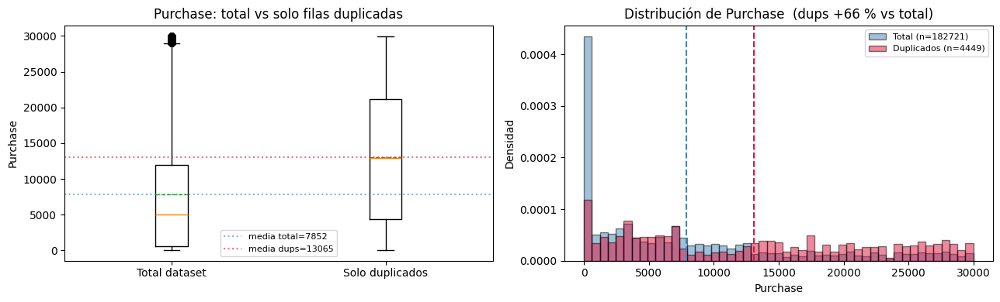

In [63]:
# dup_mask: mascara de filas que son parte de algun par (User_ID, Product_ID) duplicado
dup_mask = df.duplicated(subset=["User_ID", "Product_ID"], keep=False)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

# Boxplot side-by-side
axes[0].boxplot(
    [df["Purchase"], df[dup_mask]["Purchase"]],
    labels=["Total dataset", "Solo duplicados"],
    showmeans=True,
    meanline=True,
)
axes[0].axhline(
    df["Purchase"].mean(),
    color="steelblue",
    linestyle=":",
    alpha=0.6,
    label=f"media total={df['Purchase'].mean():.0f}",
)
axes[0].axhline(
    df[dup_mask]["Purchase"].mean(),
    color="crimson",
    linestyle=":",
    alpha=0.6,
    label=f"media dups={df[dup_mask]['Purchase'].mean():.0f}",
)
axes[0].set_ylabel("Purchase")
axes[0].set_title("Purchase: total vs solo filas duplicadas")
axes[0].legend(fontsize=8)

# Histogramas superpuestos normalizados
bins = np.linspace(0, df["Purchase"].max(), 50)
axes[1].hist(
    df["Purchase"],
    bins=bins,
    alpha=0.5,
    density=True,
    color="steelblue",
    edgecolor="black",
    label=f"Total (n={len(df)})",
)
axes[1].hist(
    df[dup_mask]["Purchase"],
    bins=bins,
    alpha=0.5,
    density=True,
    color="crimson",
    edgecolor="black",
    label=f"Duplicados (n={dup_mask.sum()})",
)
axes[1].axvline(df["Purchase"].mean(), color="steelblue", linestyle="--")
axes[1].axvline(df[dup_mask]["Purchase"].mean(), color="crimson", linestyle="--")
axes[1].set_xlabel("Purchase")
axes[1].set_ylabel("Densidad")
axes[1].set_title(
    f"Distribución de Purchase  (dups +{(df[dup_mask]['Purchase'].mean()/df['Purchase'].mean()-1)*100:.0f} % vs total)"
)
axes[1].legend(fontsize=8)

plt.tight_layout()
plt.show()

Esto llama la atención. El promedio de los duplicados es mayor que el promedio total de las purchases de todo el dataset. La hipotesis planteada al inicio de esta seccion de que los duplicados podrian ser compras recurrentes no concuerda con lo que se ve en los analisis.

Compras recurrentes podrian ser cosas baratas por asi decirlo en la que un usuario compra exactamente un producto recurrentement: Un snack, un refresco, un chicle, etc.


Veamos como se distribuyen los precios de los productos con los duplicados


In [64]:
precio_por_cat = df.groupby("Product_Category")["Purchase"].mean().round(0)
freq_dup = df[dup_mask]["Product_Category"].value_counts(normalize=True) * 100
freq_tot = df["Product_Category"].value_counts(normalize=True) * 100

cruce = pd.DataFrame(
    {
        "precio_promedio": precio_por_cat,
        "pct_en_duplicados": freq_dup,
        "pct_en_total": freq_tot,
        "delta_pp": (freq_dup - freq_tot).round(2),
    }
).sort_values("precio_promedio", ascending=False)
print(cruce)

# Y un resumen:
caras = precio_por_cat.nlargest(5).index
print(f"\nTop-5 categorías más caras: {list(caras)}")
print(f"Su participación en duplicados: {freq_dup.reindex(caras).sum():.1f} %")
print(f"Su participación en total:      {freq_tot.reindex(caras).sum():.1f} %")

                  precio_promedio  pct_en_duplicados  pct_en_total  delta_pp
Product_Category                                                            
20                        22033.0           9.867386      4.874645      4.99
13                        20985.0           8.473814      4.131435      4.34
18                        20975.0           9.305462      4.253479      5.05
19                        20931.0          10.159586      4.170840      5.99
3                         11748.0          19.015509     10.918285      8.10
9                          9856.0           1.708249      4.054269     -2.35
7                          9670.0           1.483479      3.272202     -1.79
6                          9665.0           1.213756      3.322005     -2.11
11                         7743.0           5.102270      6.232453     -1.13
12                         7729.0           5.371994      6.728291     -1.36
14                         5491.0           5.102270      3.323646      1.78

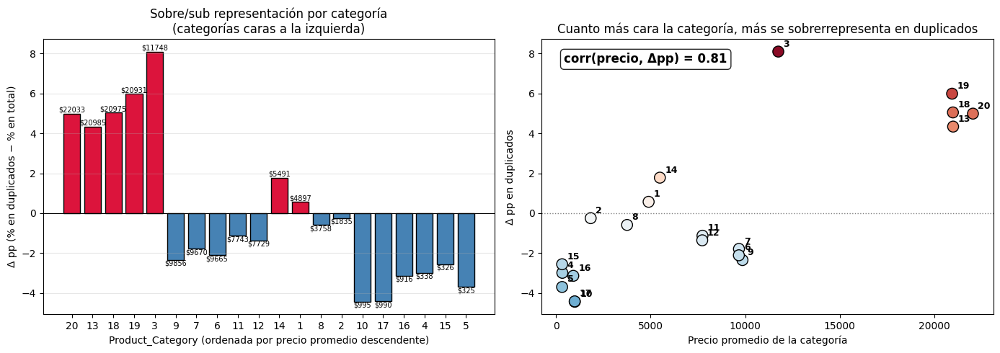

In [65]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Panel A: barras de delta_pp ordenadas por precio (caras → baratas)
colors = ["crimson" if d > 0 else "steelblue" for d in cruce["delta_pp"]]
axes[0].bar(cruce.index.astype(str), cruce["delta_pp"], color=colors, edgecolor="black")
axes[0].axhline(0, color="black", linewidth=0.8)
axes[0].set_xlabel("Product_Category (ordenada por precio promedio descendente)")
axes[0].set_ylabel("Δ pp (% en duplicados − % en total)")
axes[0].set_title(
    "Sobre/sub representación por categoría\n(categorías caras a la izquierda)"
)
axes[0].grid(axis="y", alpha=0.3)
# Anotar precio promedio
for i, (cat, row) in enumerate(cruce.iterrows()):
    axes[0].annotate(
        f"${row['precio_promedio']:.0f}",
        (i, row["delta_pp"]),
        ha="center",
        va="bottom" if row["delta_pp"] > 0 else "top",
        fontsize=7,
        rotation=0,
    )

# Panel B: scatter precio vs delta_pp + correlación
axes[1].scatter(
    cruce["precio_promedio"],
    cruce["delta_pp"],
    s=120,
    c=cruce["delta_pp"],
    cmap="RdBu_r",
    edgecolor="black",
    vmin=-9,
    vmax=9,
)
for cat, row in cruce.iterrows():
    axes[1].annotate(
        str(cat),
        (row["precio_promedio"], row["delta_pp"]),
        fontsize=9,
        xytext=(5, 5),
        textcoords="offset points",
        fontweight="bold",
    )
axes[1].axhline(0, color="gray", linestyle=":", linewidth=1)
axes[1].set_xlabel("Precio promedio de la categoría")
axes[1].set_ylabel("Δ pp en duplicados")
axes[1].set_title("Cuanto más cara la categoría, más se sobrerrepresenta en duplicados")

corr = cruce["precio_promedio"].corr(cruce["delta_pp"])
axes[1].text(
    0.05,
    0.95,
    f"corr(precio, Δpp) = {corr:.2f}",
    transform=axes[1].transAxes,
    fontsize=12,
    verticalalignment="top",
    fontweight="bold",
    bbox=dict(boxstyle="round", facecolor="white", alpha=0.85),
)

plt.tight_layout()
plt.show()

In [66]:
target_con = df.groupby("User_ID")["Purchase"].mean()
target_sin = df.drop_duplicates().groupby("User_ID")["Purchase"].mean()

diff = (target_con - target_sin).abs()
diff_pct = diff / target_sin * 100

print(
    f"Usuarios afectados por el drop: {(diff > 0).sum()} "
    f"({(diff > 0).mean()*100:.1f} %)"
)
print("|Δ purchase_mean| descriptivo (solo usuarios afectados):")
print(diff[diff > 0].describe().round(2))
print("\n|Δ %| descriptivo (solo usuarios afectados):")
print(diff_pct[diff_pct > 0].describe().round(3))

Usuarios afectados por el drop: 1657 (22.3 %)
|Δ purchase_mean| descriptivo (solo usuarios afectados):
count    1657.00
mean      223.23
std       201.62
min         0.09
25%        79.17
50%       170.32
75%       319.88
max      2034.04
Name: Purchase, dtype: float64

|Δ %| descriptivo (solo usuarios afectados):
count    1657.000
mean        2.625
std         3.134
min         0.001
25%         0.922
50%         1.880
75%         3.364
max        57.652
Name: Purchase, dtype: float64


Evidencias vistas respecto los duplicados:

- Las filas duplicadas pagan en promedio 13065 vs 7852 del total de todo el dataset
- Las categorias mas caras concentran el 56.8 % de los duplicados. Las 6 categorias mas baratas estan todas sub representadas en duplicados.
- El patron de que los mas caros son los mas duplicados no sugiere compras recurrentes.

Esto, combinado con el 22.3% de usuarios afectados y outliers de hasta 57% de cambio en el target por usuario y que los duplicados representa un 1.23 % del dataset, justifica dropear los duplicados exactos antes del split.


In [67]:
n_antes = len(df)
df = df.drop_duplicates().reset_index(drop=True)
n_despues = len(df)

print(f"Filas antes:    {n_antes}")
print(f"Filas después:  {n_despues}")
print(f"Eliminadas:     {n_antes - n_despues}")
print(f"% eliminado:    {(n_antes - n_despues) / n_antes * 100:.2f} %")

# Verificación: ya no quedan duplicados
assert df.duplicated().sum() == 0, "Aún quedan duplicados"
assert (
    df.duplicated(subset=["User_ID", "Product_ID"]).sum() == 0
), "Aún quedan pares (User_ID, Product_ID) repetidos"
print("\n✓ Verificación: sin duplicados restantes")

Filas antes:    182721
Filas después:  180472
Eliminadas:     2249
% eliminado:    1.23 %

✓ Verificación: sin duplicados restantes


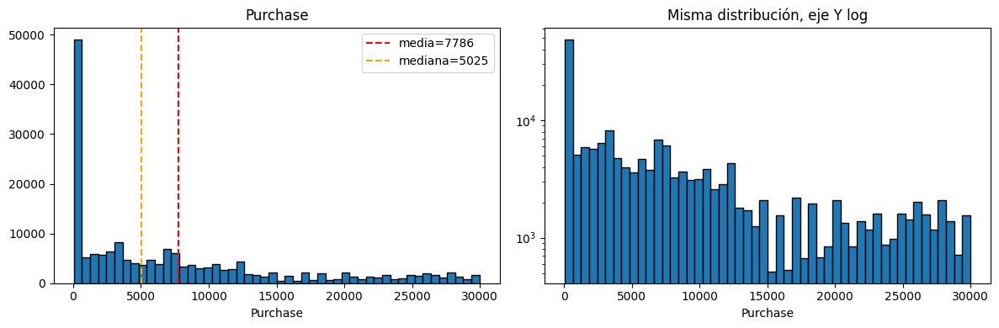

Skewness del purchase: 1.116


In [68]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(df["Purchase"], bins=50, edgecolor="black")
axes[0].axvline(
    df["Purchase"].mean(),
    color="red",
    linestyle="--",
    label=f"media={df['Purchase'].mean():.0f}",
)
axes[0].axvline(
    df["Purchase"].median(),
    color="orange",
    linestyle="--",
    label=f"mediana={df['Purchase'].median():.0f}",
)
axes[0].set_title("Purchase")
axes[0].set_xlabel("Purchase")
axes[0].legend()

axes[1].hist(df["Purchase"], bins=50, edgecolor="black")
axes[1].set_yscale("log")
axes[1].set_title("Misma distribución, eje Y log")
axes[1].set_xlabel("Purchase")

plt.tight_layout()
plt.show()

print(f"Skewness del purchase: {df['Purchase'].skew():.3f}")

Esto nos dice que los productos tienen una gran variedad de precios. La mitad de las transacciones cuesta menos de 5060 pero las transacciones caras inflan el promedio, es decir la media supera a la mediana. Aquí se puede intuir que un promedio de "purchase" por usuario sería más estable como target.

Observaciones generales:

- 182,721 registros x 11 columnas: 7,432 usuarios únicos
- Los nulos están distribuidos en "Product_Subcategroy_1" y "Product_Subcategory_2"
- "Age" y "Stay_In_Current_City_Years" son variables ordinales con valores como "2" en string pero también como los siguientes: "+55", "25-35", etc. Una codificación ordinal podría ser la mejor codificación para estos dos casos debido a que hay rangos muy grandes como "+55" o "0-17"
- Registros duplicados dropeados (ver analisis arriba)


# Datos del usuario


Transacciones por usuario


count    7432.000000
mean       24.283100
std        13.359699
min         9.000000
25%        14.000000
50%        18.000000
75%        39.000000
max        50.000000
Name: count, dtype: float64


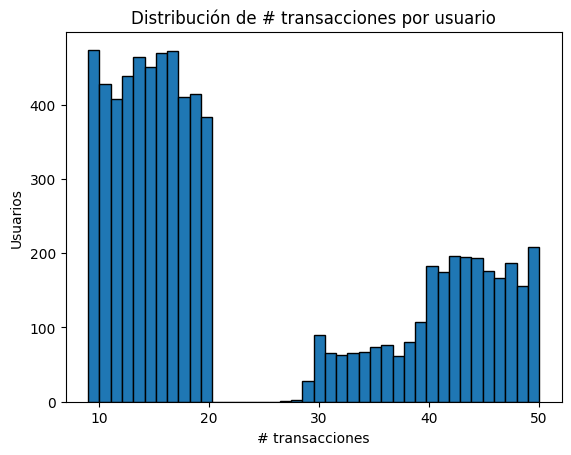

In [71]:
trans_por_user = df["User_ID"].value_counts()
print(trans_por_user.describe())

plt.hist(trans_por_user, bins=40, edgecolor="black")
plt.title("Distribución de # transacciones por usuario")
plt.xlabel("# transacciones")
plt.ylabel("Usuarios")
plt.show()

Datos demograficos


In [72]:
demograficas = [
    "Age",
    "Gender",
    "Marital_Status",
    "City_Category",
    "Stay_In_Current_City_Years",
]

consistencia = df.groupby("User_ID")[demograficas].nunique().max()
print("Máximo de valores distintos por usuario en cada demográfica:")
print(consistencia)
assert (consistencia == 1).all(), "Hay demográficas que cambian dentro de un User_ID"

Máximo de valores distintos por usuario en cada demográfica:
Age                           1
Gender                        1
Marital_Status                1
City_Category                 1
Stay_In_Current_City_Years    1
dtype: int64


- Cada usuario tiene entre 10 50 transacciones
- Hay consistencia en datos demograficos de los usuarios. Es decir, un mismo usuario aparece con los mismos datos consistemente a lo largo del dataset


# Split del dataset

Hacemos el split del dataset antes de cualquier imputacion, tratamiento de nulos, codificación.

El target es un promedio de las purchases, por lo tanto hacemos un split por user_id. Asi evitamos tener el mismo usario en train y val, que seria data leakage.


In [74]:
from sklearn.model_selection import train_test_split

unique_users = df["User_ID"].unique()
users_train, users_val = train_test_split(unique_users, test_size=0.2, random_state=42)

df_train_tx = df[df["User_ID"].isin(users_train)].copy()
df_val_tx = df[df["User_ID"].isin(users_val)].copy()

print(f"Train: {len(users_train)} usuarios, {len(df_train_tx)} transacciones")
print(f"Val:   {len(users_val)} usuarios, {len(df_val_tx)} transacciones")

# verificacion
assert (
    df_train_tx["User_ID"].nunique() + df_val_tx["User_ID"].nunique()
    == df["User_ID"].nunique()
)
assert set(df_train_tx["User_ID"]).isdisjoint(
    df_val_tx["User_ID"]
), "Hay usuarios en ambos splits → leakage"

Train: 5945 usuarios, 143972 transacciones
Val:   1487 usuarios, 36500 transacciones


## Analisis de columnas


In [75]:
for c in df_train_tx.columns:
    print(f"{c:30s} → {df_train_tx[c].nunique():>6d} valores únicos (train)")

User_ID                        →   5945 valores únicos (train)
Product_ID                     →   2455 valores únicos (train)
Age                            →      7 valores únicos (train)
Gender                         →      2 valores únicos (train)
Marital_Status                 →      2 valores únicos (train)
City_Category                  →      3 valores únicos (train)
Stay_In_Current_City_Years     →      5 valores únicos (train)
Product_Category               →     20 valores únicos (train)
Product_Subcategory_1          →     33 valores únicos (train)
Product_Subcategory_2          →     16 valores únicos (train)
Purchase                       →   1833 valores únicos (train)


Product_Id tiene una cardinalidad alta. Sera Product_Category suficiente para describir el producto?


count    2455.000000
mean       58.644399
std        33.673661
min        18.000000
25%        37.000000
50%        44.000000
75%        64.000000
max       169.000000
Name: count, dtype: float64


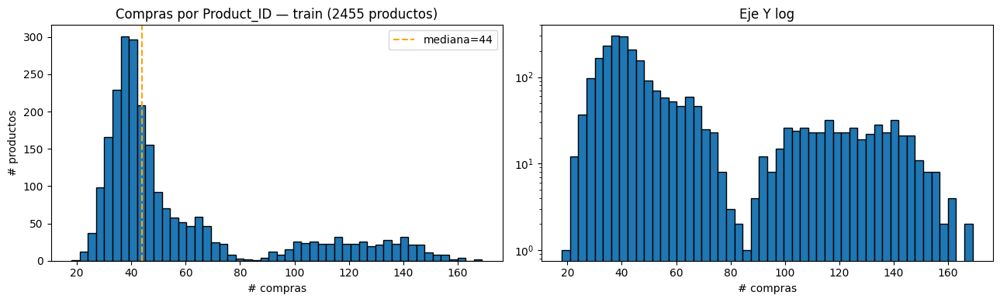

In [76]:
prod_counts = df_train_tx["Product_ID"].value_counts()
print(prod_counts.describe())

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].hist(prod_counts, bins=50, edgecolor="black")
axes[0].axvline(
    prod_counts.median(),
    color="orange",
    linestyle="--",
    label=f"mediana={prod_counts.median():.0f}",
)
axes[0].set_title(f"Compras por Product_ID — train ({len(prod_counts)} productos)")
axes[0].set_xlabel("# compras")
axes[0].set_ylabel("# productos")
axes[0].legend()
axes[1].hist(prod_counts, bins=50, edgecolor="black")
axes[1].set_yscale("log")
axes[1].set_title("Eje Y log")
axes[1].set_xlabel("# compras")
plt.tight_layout()
plt.show()

In [80]:
# Una sola vista con TODO lo que necesitás de Product_Category
resumen_cat = pd.DataFrame(
    {
        "n_subcat1": df_train_tx.groupby("Product_Category")[
            "Product_Subcategory_1"
        ].nunique(dropna=False),
        "n_subcat2": df_train_tx.groupby("Product_Category")[
            "Product_Subcategory_2"
        ].nunique(dropna=False),
        "n_productos": df_train_tx.groupby("Product_Category")["Product_ID"].nunique(),
        "n_transacciones": df_train_tx.groupby("Product_Category").size(),
        "purchase_medio": df_train_tx.groupby("Product_Category")["Purchase"]
        .mean()
        .round(0),
    }
).sort_values("purchase_medio", ascending=False)

resumen_cat

,n_subcat1,n_subcat2,n_productos,n_transacciones,purchase_medio
Product_Category,,,,,
20,17,13,50,6907,21994.0
13,16,10,42,5838,20994.0
18,17,12,44,5973,20992.0
19,15,11,43,5886,20916.0
3,30,17,156,15469,11636.0
9,16,17,142,5941,9868.0
7,16,16,114,4762,9656.0
6,16,17,117,4783,9650.0
12,16,17,169,9788,7755.0


### 2b) Modelo Multilayer Perceptron (MLP) (2.5 puntos)

Entrenar un modelo de deep learning usando PyTorch que consuma el dataframe ya pre-procesado en el paso anterior.

Características para el diseño de la red:

- El modelo debe tener un mínimo de 3 capas ocultas.
- El modelo debe tener un mínimo de 32 neuronas por cada capa oculta.
- Cada capa oculta debe tener su respectiva función de activación.
- La elección de la función de activación de las capas ocultas es libre, pero se debe justificar por qué se está eligiendo esa, ya sea mediante conceptos teóricos o con resultados de pruebas empíricas.
- Analizar y justificar cuál es la mejor función de costo, algoritmo de optimización y learning rate para este modelo.
- Analizar cuál sería el mejor número de épocas para entrenar el modelo.
- Opcional: Incluir técnicas de regularización como dropout en las capas ocultas.


### 2c) Evaluación del Modelo (1 punto)

- Graficar las evoluciones por época de la función de costo y del $R^2$, tanto para el set de train como el de validation.
- Gráfica scatter de Real VS Predicho en el set de validation.
- Explicar el proceso estratégico de iteracion utilizado para conseguir los mejores resultados y justificar los resultados obtenidos.
- Un resultado aceptable sería un $R^2$ de por lo menos 0.70 para el set de validation.


### 2d) Conclusiones finales (0.5 puntos)

Redactar de manera detallada las conclusiones finales y si se cumplió con el objetivo o no.
